In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# --- softer red so black text stays readable at high values ---
def soft_orange_red():
    return mcolors.LinearSegmentedColormap.from_list(
        "soft_orange_red",
        [
            (0.00, "#fff7f3"),
            (0.25, "#fde0dd"),
            (0.50, "#fcbba1"),
            (0.75, "#fc9272"),
            (1.00, "#ff6e6e"),
        ]
    )

def _grid(df, value_col):
    # rows = x2 ascending, cols = x1 ascending (matches your Julia export)
    xs = np.sort(df["x1"].unique())
    ys = np.sort(df["x2"].unique())
    M  = np.full((len(ys), len(xs)), np.nan)
    for i, x in enumerate(xs):
        for j, y in enumerate(ys):
            v = df.loc[(df["x1"]==x) & (df["x2"]==y), value_col]
            if len(v):
                M[j, i] = float(v.iloc[0])
    return xs, ys, M

def _fmt_pct(val):
    if np.isnan(val): return ""
    if abs(val - 100.0) < 1e-9: return "100"
    s = f"{val:.1f}"
    return s[:-2] if s.endswith(".0") else s

def plot_single_heatmap_from_csv(csv_path,
                                 title="",
                                 x_label="x₁",
                                 y_label="x₂",
                                 color_by="pct_pos",      # 'pct_pos' or 'slope_mean'
                                 show_colorbar=False,
                                 dpi=600,
                                 figsize=(6.3, 5.6),
                                 cell_fontsize=8,
                                 save_path=None,
                                 show=True):
    """
    One heatmap with all info embedded per cell.
    Color encodes either pct_pos (default) or slope_mean.
    Cell text shows:
      line 1:  % (d>0 & |ϕ20|>0) | % (d<0 & |ϕ20|>0)
      line 2:  |ϕ20/(θ1−θ3)| mean ± std
    (No sample size line.)
    """
    df = pd.read_csv(csv_path)

    xs, ys, M_pos = _grid(df, "pct_pos")
    _,  _, M_neg  = _grid(df, "pct_neg")
    _,  _, M_mu   = _grid(df, "slope_mean")
    _,  _, M_sd   = _grid(df, "slope_std")

    if color_by == "slope_mean":
        M_col = M_mu
        vmin, vmax = 0, np.nanmax(M_mu)
        if not np.isfinite(vmax) or vmax == 0: vmax = 1.0
        cmap = "viridis"
    else:  # default: pct_pos
        M_col = M_pos
        vmin, vmax = 0, 100
        cmap = soft_orange_red()

    plt.figure(figsize=figsize, dpi=dpi)
    ax = plt.gca()

    im = ax.imshow(M_col, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax, aspect="equal")

    ax.set_title(title, fontsize=14, pad=10)
    ax.set_xlabel(x_label, fontsize=12)
    ax.set_ylabel(y_label, fontsize=12)
    ax.set_xticks(range(len(xs))); ax.set_xticklabels([str(x) for x in xs], fontsize=11)
    ax.set_yticks(range(len(ys))); ax.set_yticklabels([str(y) for y in ys], fontsize=11)

    # annotate: line1 = pos | neg; line2 = mean±std
    for j in range(len(ys)):
        for i in range(len(xs)):
            L1 = ""
            if np.isfinite(M_pos[j,i]) and np.isfinite(M_neg[j,i]):
                L1 = f"{_fmt_pct(M_pos[j,i])} | {_fmt_pct(M_neg[j,i])}"
            elif np.isfinite(M_pos[j,i]):
                L1 = f"{_fmt_pct(M_pos[j,i])}"

            L2 = ""
            if np.isfinite(M_mu[j,i]) and np.isfinite(M_sd[j,i]):
                L2 = f"{M_mu[j,i]:.3f}±{M_sd[j,i]:.3f}"

            ax.text(i, j, (L1 + ("\n" + L2 if L2 else "")),
                    ha="center", va="center", fontsize=cell_fontsize, color="black")

    if show_colorbar:
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=10)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
    if show:
        plt.show()
    return ax

# --- example call (ER; swap labels for BA) ---
# plot_single_heatmap_from_csv(
#     "er_db_db.csv",
#     title="ER dB–dB",
#     x_label=r"$p_1$", y_label=r"$p_2$",
#     color_by="pct_pos",   # or "slope_mean"
#     dpi=600,
#     cell_fontsize=8,
#     save_path="er_db_db_single.png"
# )

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# Updated

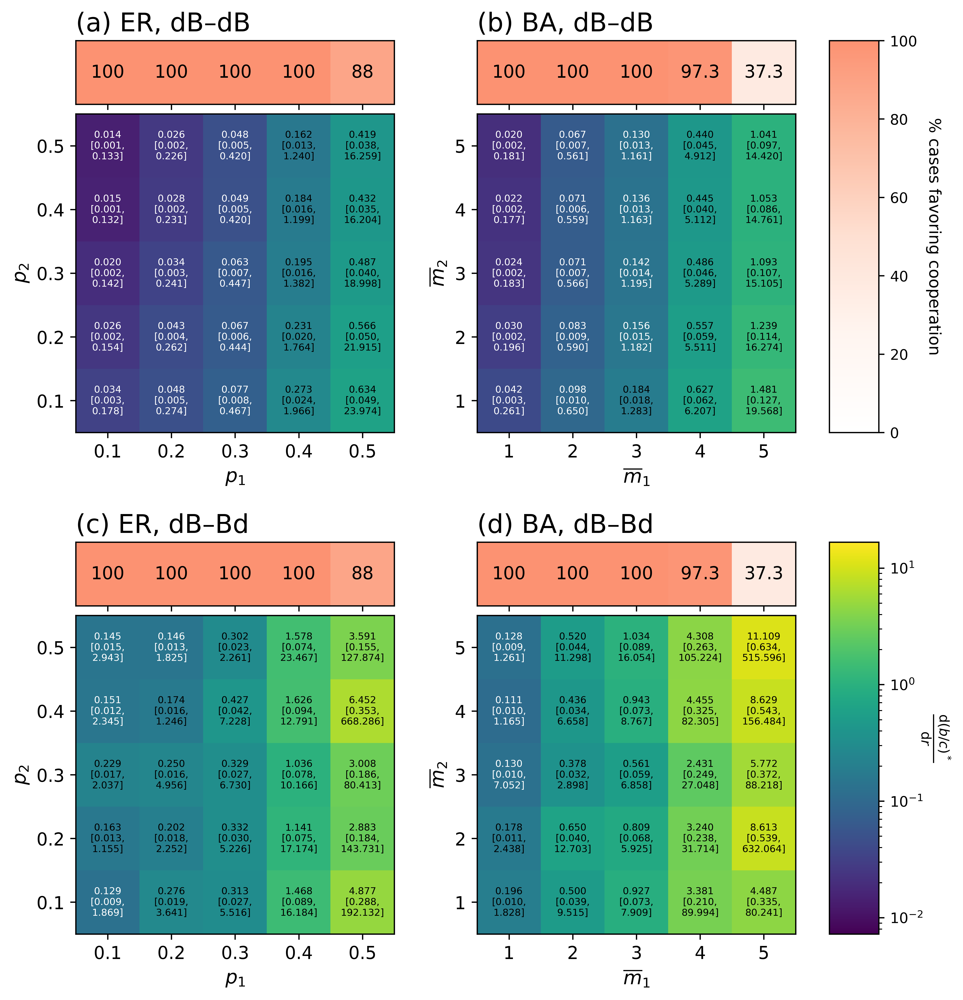

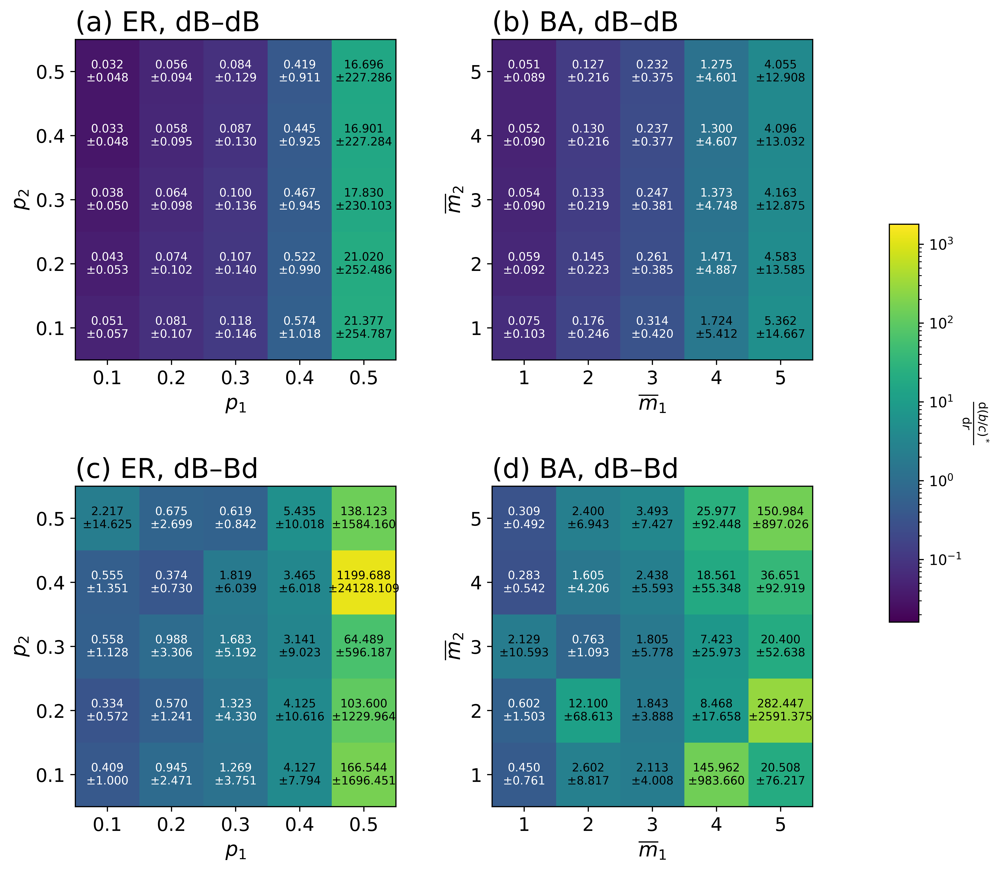

In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm
from matplotlib.gridspec import GridSpec

# ---------- Colormaps ----------
def light_percentage_cmap():
    return mcolors.LinearSegmentedColormap.from_list(
        "light_pct",
        [(0.00, "#ffffff"), (0.25, "#fff5f0"), (0.50, "#fee0d2"),
         (0.75, "#fcbba1"), (1.00, "#fc9272")]
    )

# ---------- Helper functions ----------
def _grid(df, value_col):
    xs = np.sort(df["x1"].unique())
    ys = np.sort(df["x2"].unique())
    M = np.full((len(ys), len(xs)), np.nan)
    for i, x in enumerate(xs):
        for j, y in enumerate(ys):
            v = df.loc[(df["x1"] == x) & (df["x2"] == y), value_col]
            if len(v):
                M[j, i] = float(v.iloc[0])
    return xs, ys, M

def _fmt_pct(val):
    if np.isnan(val):
        return ""
    if abs(val - 100.0) < 1e-9:
        return "100"
    s = f"{val:.1f}"
    return s[:-2] if s.endswith(".0") else s

def _fmt_axis_label(val):
    if val == int(val):
        return str(int(val))
    return str(val)

def _read_csv_smart(path):
    try:
        return pd.read_csv(path)
    except Exception:
        cols = ['x1', 'x2', 'pct_pos', 'pct_neg', 'slope_mean', 'slope_std', 'slope_n',
                'slope_median', 'slope_p5', 'slope_p10', 'slope_p90', 'slope_p95']
        return pd.read_csv(path, header=None, names=cols, skiprows=7)

def compute_global_ranges(dfs, stat_col="slope_mean"):
    all_vals = []
    for df in dfs:
        xs, ys, M = _grid(df, stat_col)
        vals = M[np.isfinite(M)]
        all_vals.extend(vals.tolist())
    all_vals = np.array(all_vals)
    if len(all_vals) == 0:
        return 0.1, 1.0
    pos_vals = all_vals[all_vals > 0]
    if len(pos_vals) == 0:
        return 0.1, 1.0
    return pos_vals.min(), pos_vals.max()

def _get_text_color(norm_value):
    if norm_value < 0.4:
        return "white"
    return "black"

# ---------- Drawing functions ----------
def draw_pct_strip(ax, df, cell_fontsize=11, vmin=0, vmax=100, cmap=None):
    xs, ys, M_pos = _grid(df, "pct_pos")
    pct_row = M_pos[0, :].reshape(1, -1)
    if cmap is None:
        cmap = light_percentage_cmap()
    im = ax.imshow(pct_row, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax, aspect="equal")
    ax.set_xticks(range(len(xs)))
    ax.set_xticklabels([])
    ax.set_yticks([])
    for i in range(len(xs)):
        if np.isfinite(pct_row[0, i]):
            txt = _fmt_pct(pct_row[0, i])
        else:
            txt = ""
        ax.text(i, 0, txt, ha="center", va="center", fontsize=cell_fontsize, color="black")
    return im

def draw_stat_heatmap(ax, df, x_label, y_label, cell_fontsize=6, decimals=3, 
                      norm=None, cmap="viridis", stat_mode="median_5_95",
                      axis_label_fontsize=12, tick_fontsize=11):
    xs, ys, M_mu = _grid(df, "slope_mean")
    _, _, M_sd = _grid(df, "slope_std")
    
    try:
        _, _, M_median = _grid(df, "slope_median")
        _, _, M_p5 = _grid(df, "slope_p5")
        _, _, M_p95 = _grid(df, "slope_p95")
        has_percentiles = True
    except:
        has_percentiles = False

    if stat_mode == "mean_std":
        M_center, M_lower, M_upper = M_mu, None, M_sd
    elif stat_mode == "median_5_95" and has_percentiles:
        M_center, M_lower, M_upper = M_median, M_p5, M_p95
    else:
        M_center, M_lower, M_upper = M_mu, None, M_sd

    M_color = np.where(M_center <= 0, np.nan, M_center) if isinstance(norm, LogNorm) else M_center.copy()
    im = ax.imshow(M_color, origin="lower", cmap=cmap, norm=norm, aspect="equal")

    ax.set_xlabel(x_label, fontsize=axis_label_fontsize)
    if y_label:
        ax.set_ylabel(y_label, fontsize=axis_label_fontsize)
    ax.set_xticks(range(len(xs)))
    ax.set_xticklabels([_fmt_axis_label(x) for x in xs], fontsize=tick_fontsize)
    ax.set_yticks(range(len(ys)))
    ax.set_yticklabels([_fmt_axis_label(y) for y in ys], fontsize=tick_fontsize)

    for j in range(len(ys)):
        for i in range(len(xs)):
            c = M_center[j, i]
            l = M_lower[j, i] if M_lower is not None else None
            u = M_upper[j, i] if M_upper is not None else np.nan

            if np.isfinite(c) and norm is not None:
                norm_val = norm(c)
                if isinstance(norm_val, np.ma.MaskedArray):
                    norm_val = float(norm_val)
                text_color = _get_text_color(norm_val)
            else:
                text_color = "black"

            if stat_mode == "mean_std":
                txt = f"{c:.{decimals}f}\n±{u:.{decimals}f}" if np.isfinite(c) and np.isfinite(u) else ""
            else:
                txt = f"{c:.{decimals}f}\n[{l:.{decimals}f},\n{u:.{decimals}f}]" if np.isfinite(c) and np.isfinite(l) and np.isfinite(u) else ""

            ax.text(i, j, txt, ha="center", va="center", fontsize=cell_fontsize, color=text_color)
    return im

# =============================================================================
# MAIN TEXT FIGURE
# =============================================================================
def plot_combined_4panel(
    er_db_db_csv="er_db_db.csv",
    er_db_bd_csv="er_db_bd.csv",
    ba_db_db_csv="ba_dB_dB.csv",
    ba_db_bd_csv="ba_dB_Bd.csv",
    dpi=600, figsize=(10, 10),
    save_path="combined_4panel.png",
    cell_fontsize_pct=11,
    cell_fontsize_stat=6,
    decimals=3,
    panel_wspace=0.30,    # Control spacing between panel columns
    cbar_gap=0.05         # Control gap before colorbar
):
    df_er_db_db = _read_csv_smart(er_db_db_csv)
    df_er_db_bd = _read_csv_smart(er_db_bd_csv)
    df_ba_db_db = _read_csv_smart(ba_db_db_csv)
    df_ba_db_bd = _read_csv_smart(ba_db_bd_csv)

    all_dfs = [df_er_db_db, df_er_db_bd, df_ba_db_db, df_ba_db_bd]
    mu_min, mu_max = compute_global_ranges(all_dfs, "slope_median")
    log_norm = LogNorm(vmin=max(mu_min * 0.5, 1e-3), vmax=mu_max * 1.5)

    pct_cmap = light_percentage_cmap()

    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # OUTER: separate panels area from colorbar area
    gs_main = GridSpec(1, 2, figure=fig,
                       width_ratios=[1, 0.04],
                       left=0.0, right=0.92, bottom=0.08, top=0.94,
                       wspace=cbar_gap)  # Gap before colorbar
    
    # INNER: 2x2 panels - control spacing independently here
    gs_panels = gs_main[0, 0].subgridspec(2, 2,
                                           width_ratios=[1, 1],
                                           wspace=panel_wspace,  # Panel-to-panel spacing
                                           hspace=0.28)
    
    # Colorbar area (split into 2 rows)
    gs_cbar = gs_main[0, 1].subgridspec(2, 1, hspace=0.28)
    
    panels = [
        (0, 0, df_er_db_db, "(a) ER, dB–dB", r"$p_1$", r"$p_2$"),
        (0, 1, df_ba_db_db, "(b) BA, dB–dB", r"$\overline{m}_1$", r"$\overline{m}_2$"),
        (1, 0, df_er_db_bd, "(c) ER, dB–Bd", r"$p_1$", r"$p_2$"),
        (1, 1, df_ba_db_bd, "(d) BA, dB–Bd", r"$\overline{m}_1$", r"$\overline{m}_2$"),
    ]
    
    pct_im = None
    stat_im = None
    
    for row, col, df, title, x_label, y_label in panels:
        gs_inner = gs_panels[row, col].subgridspec(2, 1, height_ratios=[1, 5], hspace=0.05)
        
        ax_strip = fig.add_subplot(gs_inner[0])
        ax_stat = fig.add_subplot(gs_inner[1])
        
        pct_im = draw_pct_strip(ax_strip, df, cell_fontsize=cell_fontsize_pct, cmap=pct_cmap)
        ax_strip.set_title(title, fontsize=16, loc='left', pad=6)
        
        stat_im = draw_stat_heatmap(ax_stat, df, x_label, y_label,
                                    cell_fontsize=cell_fontsize_stat,
                                    decimals=decimals, norm=log_norm,
                                    stat_mode="median_5_95")
    
    # Colorbars - one per row
    cax_pct = fig.add_subplot(gs_cbar[0])
    cbar_pct = fig.colorbar(pct_im, cax=cax_pct)
    cbar_pct.set_label("% cases favoring cooperation", fontsize=10, rotation=270, labelpad=15)
    cbar_pct.ax.tick_params(labelsize=9)
    
    cax_stat = fig.add_subplot(gs_cbar[1])
    cbar_stat = fig.colorbar(stat_im, cax=cax_stat)
    cbar_stat.set_label(r"$\frac{\mathrm{d}(b/c)^*}{\mathrm{d}r}$", fontsize=12, rotation=270, labelpad=18)
    cbar_stat.ax.tick_params(labelsize=9)

    if save_path:
        plt.savefig(save_path, dpi=dpi)
    plt.show()
    return fig

# =============================================================================
# SI FIGURE
# =============================================================================
def plot_si_mean_std(
    er_db_db_csv="er_db_db.csv",
    er_db_bd_csv="er_db_bd.csv",
    ba_db_db_csv="ba_dB_dB.csv",
    ba_db_bd_csv="ba_dB_Bd.csv",
    dpi=600, figsize=(5, 10),
    save_path="si_mean_std.png",
    cell_fontsize_stat=8,
    decimals=3,
    panel_wspace=0.40,    # Control spacing between panel columns
    cbar_gap=0.05         # Control gap before colorbar
):
    df_er_db_db = _read_csv_smart(er_db_db_csv)
    df_er_db_bd = _read_csv_smart(er_db_bd_csv)
    df_ba_db_db = _read_csv_smart(ba_db_db_csv)
    df_ba_db_bd = _read_csv_smart(ba_db_bd_csv)

    all_dfs = [df_er_db_db, df_er_db_bd, df_ba_db_db, df_ba_db_bd]
    mu_min, mu_max = compute_global_ranges(all_dfs, "slope_mean")
    log_norm = LogNorm(vmin=max(mu_min * 0.5, 1e-3), vmax=mu_max * 1.5)

    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # OUTER: separate panels area from colorbar area
    gs_main = GridSpec(1, 2, figure=fig,
                       width_ratios=[1, 0.04],
                       left=0.1, right=0.92, bottom=0.08, top=0.94,
                       wspace=cbar_gap)  # Gap before colorbar
    
    # INNER: 2x2 panels - control spacing independently here
    gs_panels = gs_main[0, 0].subgridspec(2, 2,
                                           width_ratios=[1, 1],
                                           wspace=panel_wspace,  # Panel-to-panel spacing
                                           hspace=0.28)
    
    # Colorbar area (single colorbar, centered vertically)
    # We'll manually position it to span roughly the middle portion
    gs_cbar = gs_main[0, 1].subgridspec(3, 1, height_ratios=[1, 2, 1], hspace=0.0)

    panels = [
        (0, 0, df_er_db_db, "(a) ER, dB–dB", r"$p_1$", r"$p_2$"),
        (0, 1, df_ba_db_db, "(b) BA, dB–dB", r"$\overline{m}_1$", r"$\overline{m}_2$"),
        (1, 0, df_er_db_bd, "(c) ER, dB–Bd", r"$p_1$", r"$p_2$"),
        (1, 1, df_ba_db_bd, "(d) BA, dB–Bd", r"$\overline{m}_1$", r"$\overline{m}_2$"),
    ]

    stat_im = None
    for row, col, df, title, x_label, y_label in panels:
        ax = fig.add_subplot(gs_panels[row, col])
        stat_im = draw_stat_heatmap(ax, df, x_label, y_label,
                                    cell_fontsize=cell_fontsize_stat,
                                    decimals=decimals, norm=log_norm,
                                    stat_mode="mean_std",
                                    axis_label_fontsize=14, tick_fontsize=13)
        ax.set_title(title, fontsize=19, loc='left', pad=6)

    # Single colorbar - centered vertically using middle slot of gs_cbar
    cax = fig.add_subplot(gs_cbar[1])
    cbar = fig.colorbar(stat_im, cax=cax)
    cbar.set_label(r"$\frac{\mathrm{d}(b/c)^*}{\mathrm{d}r}$", fontsize=12, rotation=270, labelpad=20)
    cbar.ax.tick_params(labelsize=10)

    if save_path:
        plt.savefig(save_path, dpi=dpi)
    plt.show()
    return fig

# =============================================================================
if __name__ == "__main__":
    plot_combined_4panel(
        er_db_db_csv="er_db_db.csv",
        er_db_bd_csv="er_db_bd.csv",
        ba_db_db_csv="ba_dB_dB.csv",
        ba_db_bd_csv="ba_dB_Bd.csv",
        dpi=600,
        figsize=(10, 9),
        save_path="random_graphs_2x4_5_95.png",
        cell_fontsize_pct=11,
        cell_fontsize_stat=6,
        decimals=3,
        panel_wspace=-0.52,   # Adjust this to control space between columns (a,c) and (b,d)
        cbar_gap=-0.35        # Adjust this to control colorbar distance from panels
    )
    
    plot_si_mean_std(
        er_db_db_csv="er_db_db.csv",
        er_db_bd_csv="er_db_bd.csv",
        ba_db_db_csv="ba_dB_dB.csv",
        ba_db_bd_csv="ba_dB_Bd.csv",
        dpi=600,
        figsize=(10, 9),
        save_path="random_graphs_mean_std.png",
        cell_fontsize_stat=8,
        decimals=3,
        panel_wspace=0.3,      # Adjust this to control space between columns
        cbar_gap=0.2        # Adjust this to control colorbar distance from panels
    )

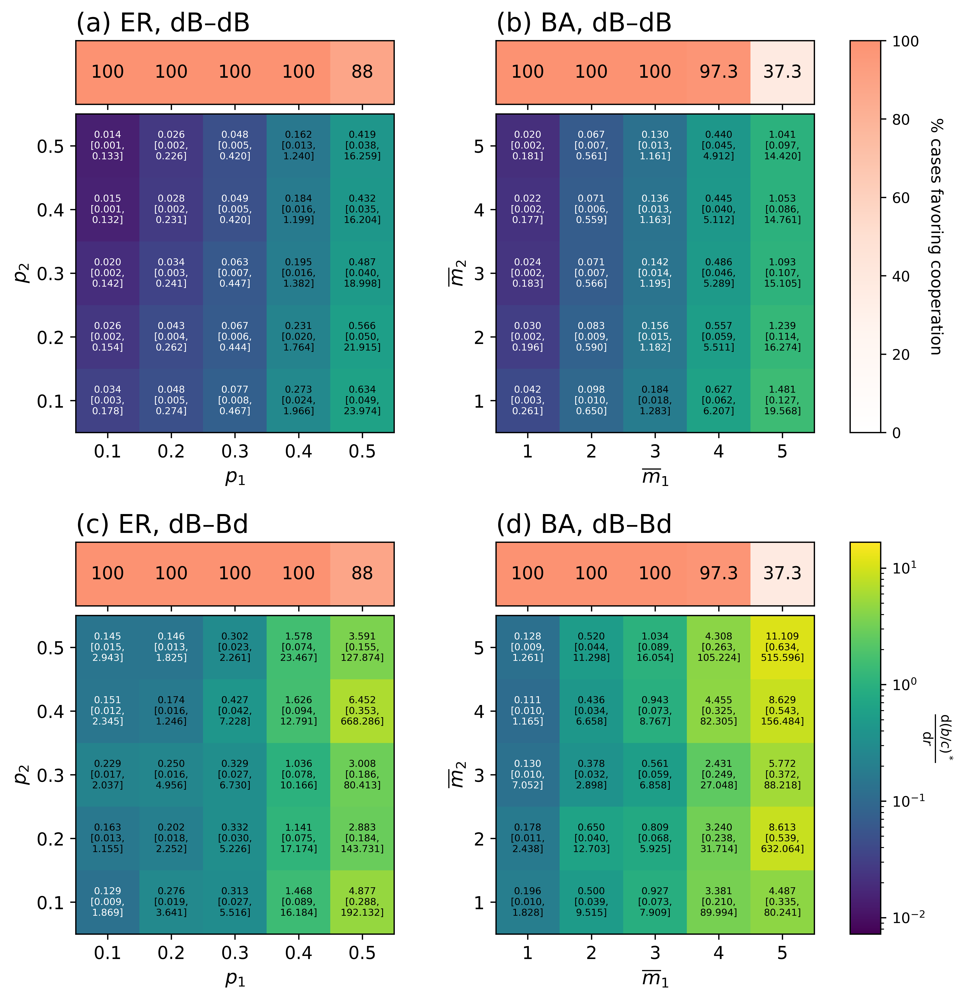

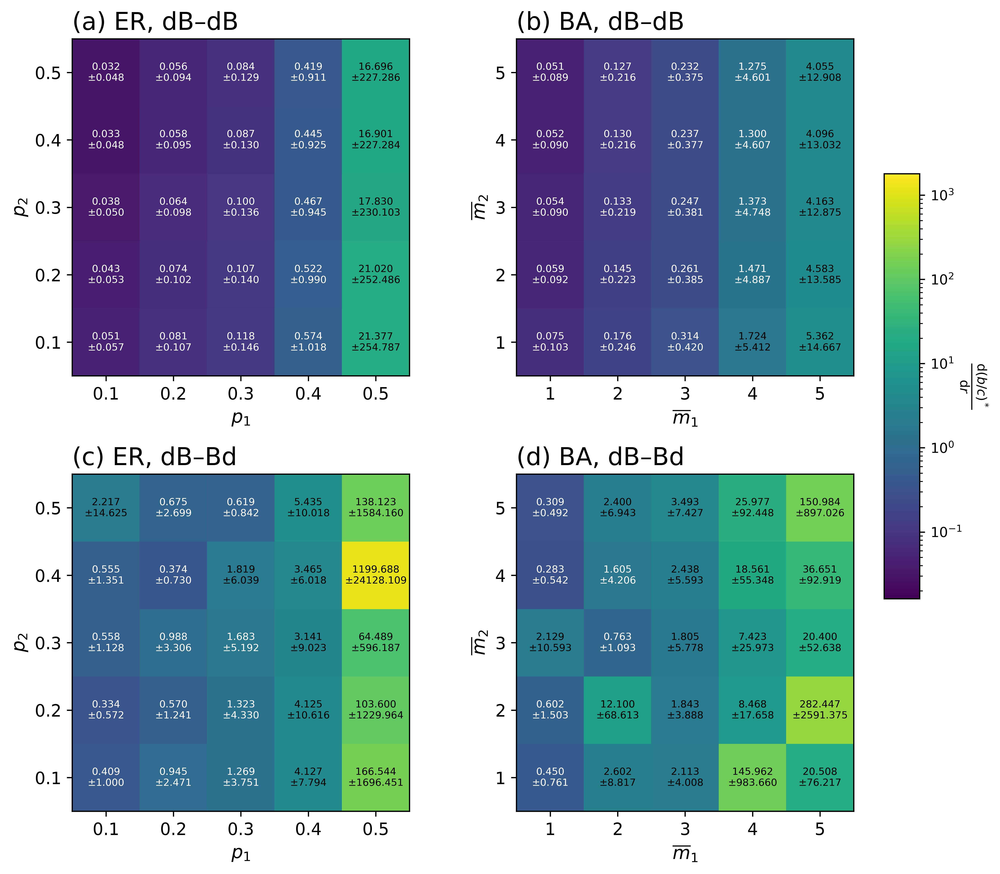

In [125]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm
from matplotlib.gridspec import GridSpec

# ---------- Colormaps ----------
def light_percentage_cmap():
    return mcolors.LinearSegmentedColormap.from_list(
        "light_pct",
        [(0.00, "#ffffff"), (0.25, "#fff5f0"), (0.50, "#fee0d2"),
         (0.75, "#fcbba1"), (1.00, "#fc9272")]
    )

# ---------- Helper functions ----------
def _grid(df, value_col):
    xs = np.sort(df["x1"].unique())
    ys = np.sort(df["x2"].unique())
    M = np.full((len(ys), len(xs)), np.nan)
    for i, x in enumerate(xs):
        for j, y in enumerate(ys):
            v = df.loc[(df["x1"] == x) & (df["x2"] == y), value_col]
            if len(v):
                M[j, i] = float(v.iloc[0])
    return xs, ys, M

def _fmt_pct(val):
    if np.isnan(val):
        return ""
    if abs(val - 100.0) < 1e-9:
        return "100"
    s = f"{val:.1f}"
    return s[:-2] if s.endswith(".0") else s

def _fmt_axis_label(val):
    if val == int(val):
        return str(int(val))
    return str(val)

def _read_csv_smart(path):
    try:
        return pd.read_csv(path)
    except Exception:
        cols = ['x1', 'x2', 'pct_pos', 'pct_neg', 'slope_mean', 'slope_std', 'slope_n',
                'slope_median', 'slope_p5', 'slope_p10', 'slope_p90', 'slope_p95']
        return pd.read_csv(path, header=None, names=cols, skiprows=7)

def compute_global_ranges(dfs, stat_col="slope_mean"):
    all_vals = []
    for df in dfs:
        xs, ys, M = _grid(df, stat_col)
        vals = M[np.isfinite(M)]
        all_vals.extend(vals.tolist())
    all_vals = np.array(all_vals)
    if len(all_vals) == 0:
        return 0.1, 1.0
    pos_vals = all_vals[all_vals > 0]
    if len(pos_vals) == 0:
        return 0.1, 1.0
    return pos_vals.min(), pos_vals.max()

def _get_text_color(norm_value):
    if norm_value < 0.4:
        return "white"
    return "black"

# ---------- Drawing functions ----------
def draw_pct_strip(ax, df, cell_fontsize=11, vmin=0, vmax=100, cmap=None):
    xs, ys, M_pos = _grid(df, "pct_pos")
    pct_row = M_pos[0, :].reshape(1, -1)
    if cmap is None:
        cmap = light_percentage_cmap()
    im = ax.imshow(pct_row, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax, aspect="equal")
    ax.set_xticks(range(len(xs)))
    ax.set_xticklabels([])
    ax.set_yticks([])
    for i in range(len(xs)):
        if np.isfinite(pct_row[0, i]):
            txt = _fmt_pct(pct_row[0, i])
        else:
            txt = ""
        ax.text(i, 0, txt, ha="center", va="center", fontsize=cell_fontsize, color="black")
    return im

def draw_stat_heatmap(ax, df, x_label, y_label, cell_fontsize=6, decimals=3, 
                      norm=None, cmap="viridis", stat_mode="median_5_95",
                      axis_label_fontsize=12, tick_fontsize=11):
    xs, ys, M_mu = _grid(df, "slope_mean")
    _, _, M_sd = _grid(df, "slope_std")
    
    try:
        _, _, M_median = _grid(df, "slope_median")
        _, _, M_p5 = _grid(df, "slope_p5")
        _, _, M_p95 = _grid(df, "slope_p95")
        has_percentiles = True
    except:
        has_percentiles = False

    if stat_mode == "mean_std":
        M_center, M_lower, M_upper = M_mu, None, M_sd
    elif stat_mode == "median_5_95" and has_percentiles:
        M_center, M_lower, M_upper = M_median, M_p5, M_p95
    else:
        M_center, M_lower, M_upper = M_mu, None, M_sd

    M_color = np.where(M_center <= 0, np.nan, M_center) if isinstance(norm, LogNorm) else M_center.copy()
    im = ax.imshow(M_color, origin="lower", cmap=cmap, norm=norm, aspect="equal")

    ax.set_xlabel(x_label, fontsize=axis_label_fontsize)
    if y_label:
        ax.set_ylabel(y_label, fontsize=axis_label_fontsize)
    ax.set_xticks(range(len(xs)))
    ax.set_xticklabels([_fmt_axis_label(x) for x in xs], fontsize=tick_fontsize)
    ax.set_yticks(range(len(ys)))
    ax.set_yticklabels([_fmt_axis_label(y) for y in ys], fontsize=tick_fontsize)

    for j in range(len(ys)):
        for i in range(len(xs)):
            c = M_center[j, i]
            l = M_lower[j, i] if M_lower is not None else None
            u = M_upper[j, i] if M_upper is not None else np.nan

            if np.isfinite(c) and norm is not None:
                norm_val = norm(c)
                if isinstance(norm_val, np.ma.MaskedArray):
                    norm_val = float(norm_val)
                text_color = _get_text_color(norm_val)
            else:
                text_color = "black"

            if stat_mode == "mean_std":
                txt = f"{c:.{decimals}f}\n±{u:.{decimals}f}" if np.isfinite(c) and np.isfinite(u) else ""
            else:
                txt = f"{c:.{decimals}f}\n[{l:.{decimals}f},\n{u:.{decimals}f}]" if np.isfinite(c) and np.isfinite(l) and np.isfinite(u) else ""

            ax.text(i, j, txt, ha="center", va="center", fontsize=cell_fontsize, color=text_color)
    return im

# =============================================================================
# MAIN TEXT FIGURE
# =============================================================================
def plot_combined_4panel(
    er_db_db_csv="er_db_db.csv",
    er_db_bd_csv="er_db_bd.csv",
    ba_db_db_csv="ba_dB_dB.csv",
    ba_db_bd_csv="ba_dB_Bd.csv",
    dpi=600, figsize=(10, 10),
    save_path="combined_4panel.png",
    cell_fontsize_pct=11,
    cell_fontsize_stat=6,
    decimals=3,
    panel_wspace=0.30,    # Control spacing between panel columns
    cbar_gap=0.05         # Control gap before colorbar
):
    df_er_db_db = _read_csv_smart(er_db_db_csv)
    df_er_db_bd = _read_csv_smart(er_db_bd_csv)
    df_ba_db_db = _read_csv_smart(ba_db_db_csv)
    df_ba_db_bd = _read_csv_smart(ba_db_bd_csv)

    all_dfs = [df_er_db_db, df_er_db_bd, df_ba_db_db, df_ba_db_bd]
    mu_min, mu_max = compute_global_ranges(all_dfs, "slope_median")
    log_norm = LogNorm(vmin=max(mu_min * 0.5, 1e-3), vmax=mu_max * 1.5)

    pct_cmap = light_percentage_cmap()

    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # OUTER: separate panels area from colorbar area
    gs_main = GridSpec(1, 2, figure=fig,
                       width_ratios=[1, 0.03],
                       left=0.10, right=0.92, bottom=0.08, top=0.94,
                       wspace=cbar_gap)  # Gap before colorbar
    
    # INNER: 2x2 panels - control spacing independently here
    gs_panels = gs_main[0, 0].subgridspec(2, 2,
                                           width_ratios=[1, 1],
                                           wspace=panel_wspace,  # Panel-to-panel spacing
                                           hspace=0.28)
    
    # Colorbar area (split into 2 rows)
    gs_cbar = gs_main[0, 1].subgridspec(2, 1, hspace=0.28)
    
    panels = [
        (0, 0, df_er_db_db, "(a) ER, dB–dB", r"$p_1$", r"$p_2$"),
        (0, 1, df_ba_db_db, "(b) BA, dB–dB", r"$\overline{m}_1$", r"$\overline{m}_2$"),
        (1, 0, df_er_db_bd, "(c) ER, dB–Bd", r"$p_1$", r"$p_2$"),
        (1, 1, df_ba_db_bd, "(d) BA, dB–Bd", r"$\overline{m}_1$", r"$\overline{m}_2$"),
    ]
    
    pct_im = None
    stat_im = None
    
    for row, col, df, title, x_label, y_label in panels:
        gs_inner = gs_panels[row, col].subgridspec(2, 1, height_ratios=[1, 5], hspace=0.05)
        
        ax_strip = fig.add_subplot(gs_inner[0])
        ax_stat = fig.add_subplot(gs_inner[1])
        
        pct_im = draw_pct_strip(ax_strip, df, cell_fontsize=cell_fontsize_pct, cmap=pct_cmap)
        ax_strip.set_title(title, fontsize=16, loc='left', pad=6)
        
        stat_im = draw_stat_heatmap(ax_stat, df, x_label, y_label,
                                    cell_fontsize=cell_fontsize_stat,
                                    decimals=decimals, norm=log_norm,
                                    stat_mode="median_5_95")
    
    # Colorbars - one per row
    cax_pct = fig.add_subplot(gs_cbar[0])
    cbar_pct = fig.colorbar(pct_im, cax=cax_pct)
    cbar_pct.set_label("% cases favoring cooperation", fontsize=10, rotation=270, labelpad=15)
    cbar_pct.ax.tick_params(labelsize=9)
    
    cax_stat = fig.add_subplot(gs_cbar[1])
    cbar_stat = fig.colorbar(stat_im, cax=cax_stat)
    cbar_stat.set_label(r"$\frac{\mathrm{d}(b/c)^*}{\mathrm{d}r}$", fontsize=12, rotation=270, labelpad=18)
    cbar_stat.ax.tick_params(labelsize=9)

    if save_path:
        plt.savefig(save_path, dpi=dpi)
    plt.show()
    return fig

# =============================================================================
# SI FIGURE
# =============================================================================
def plot_si_mean_std(
    er_db_db_csv="er_db_db.csv",
    er_db_bd_csv="er_db_bd.csv",
    ba_db_db_csv="ba_dB_dB.csv",
    ba_db_bd_csv="ba_dB_Bd.csv",
    dpi=600, figsize=(10, 10),
    save_path="si_mean_std.png",
    cell_fontsize_stat=6,
    decimals=3,
    panel_wspace=0.30,    # Control spacing between panel columns
    panel_hspace=0.18,
    cbar_gap=0.05         # Control gap before colorbar
):
    df_er_db_db = _read_csv_smart(er_db_db_csv)
    df_er_db_bd = _read_csv_smart(er_db_bd_csv)
    df_ba_db_db = _read_csv_smart(ba_db_db_csv)
    df_ba_db_bd = _read_csv_smart(ba_db_bd_csv)

    all_dfs = [df_er_db_db, df_er_db_bd, df_ba_db_db, df_ba_db_bd]
    mu_min, mu_max = compute_global_ranges(all_dfs, "slope_mean")
    log_norm = LogNorm(vmin=max(mu_min * 0.5, 1e-3), vmax=mu_max * 1.5)

    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # OUTER: separate panels area from colorbar area (IDENTICAL to main figure)
    gs_main = GridSpec(1, 2, figure=fig,
                       width_ratios=[1, 0.04],
                       left=0.10, right=0.92, bottom=0.08, top=0.94,
                       wspace=cbar_gap)
    
    # INNER: 2x2 panels (IDENTICAL to main figure)
    gs_panels = gs_main[0, 0].subgridspec(2, 2,
                                           width_ratios=[1, 1],
                                           wspace=panel_wspace,
                                           hspace=panel_hspace)  # Reduced since no pct strip
    
    # Colorbar area - 3 rows to center the colorbar vertically
    # height_ratios=[1, 2, 1] makes middle slot = 50% height (same as one row in main figure's 2-row setup)
    gs_cbar = gs_main[0, 1].subgridspec(3, 1, height_ratios=[1, 2, 1], hspace=0.0)

    panels = [
        (0, 0, df_er_db_db, "(a) ER, dB–dB", r"$p_1$", r"$p_2$"),
        (0, 1, df_ba_db_db, "(b) BA, dB–dB", r"$\overline{m}_1$", r"$\overline{m}_2$"),
        (1, 0, df_er_db_bd, "(c) ER, dB–Bd", r"$p_1$", r"$p_2$"),
        (1, 1, df_ba_db_bd, "(d) BA, dB–Bd", r"$\overline{m}_1$", r"$\overline{m}_2$"),
    ]

    stat_im = None
    for row, col, df, title, x_label, y_label in panels:
        # Same subgridspec structure as main figure, just use the heatmap slot only
        gs_inner = gs_panels[row, col].subgridspec(2, 1, height_ratios=[1, 5], hspace=0.05)
        
        # Skip ax_strip (index 0), only create ax_stat (index 1)
        ax_stat = fig.add_subplot(gs_inner[1])
        
        stat_im = draw_stat_heatmap(ax_stat, df, x_label, y_label,
                                    cell_fontsize=cell_fontsize_stat,
                                    decimals=decimals, norm=log_norm,
                                    stat_mode="mean_std",
                                    axis_label_fontsize=12, tick_fontsize=11)
        ax_stat.set_title(title, fontsize=16, loc='left', pad=6)

    # Single colorbar - centered vertically using middle slot
    cax = fig.add_subplot(gs_cbar[1])  # Use just the bottom slot, same as main figure's stat colorbar
    cbar = fig.colorbar(stat_im, cax=cax)
    cbar.set_label(r"$\frac{\mathrm{d}(b/c)^*}{\mathrm{d}r}$", fontsize=12, rotation=270, labelpad=18)
    cbar.ax.tick_params(labelsize=9)

    if save_path:
        plt.savefig(save_path, dpi=dpi)
    plt.show()
    return fig

# =============================================================================
if __name__ == "__main__":
    plot_combined_4panel(
        er_db_db_csv="er_db_db.csv",
        er_db_bd_csv="er_db_bd.csv",
        ba_db_db_csv="ba_dB_dB.csv",
        ba_db_bd_csv="ba_dB_Bd.csv",
        dpi=600,
        figsize=(10, 9),
        save_path="random_graphs_2x4_5_95.png",
        cell_fontsize_pct=11,
        cell_fontsize_stat=6,
        decimals=3,
        panel_wspace=-0.3,   # Adjust this to control space between columns (a,c) and (b,d)
        cbar_gap=-0.2        # Adjust this to control colorbar distance from panels
    )
    
    plot_si_mean_std(
        er_db_db_csv="er_db_db.csv",
        er_db_bd_csv="er_db_bd.csv",
        ba_db_db_csv="ba_dB_dB.csv",
        ba_db_bd_csv="ba_dB_Bd.csv",
        dpi=600,
        figsize=(10, 9),
        save_path="random_graphs_mean_std.png",
        cell_fontsize_stat=6.5,    # Same as main figure
        decimals=3,
        panel_wspace=-0,       # Same as main figure
        panel_hspace=0.05,
        cbar_gap=-0.05            # Same as main figure
    )

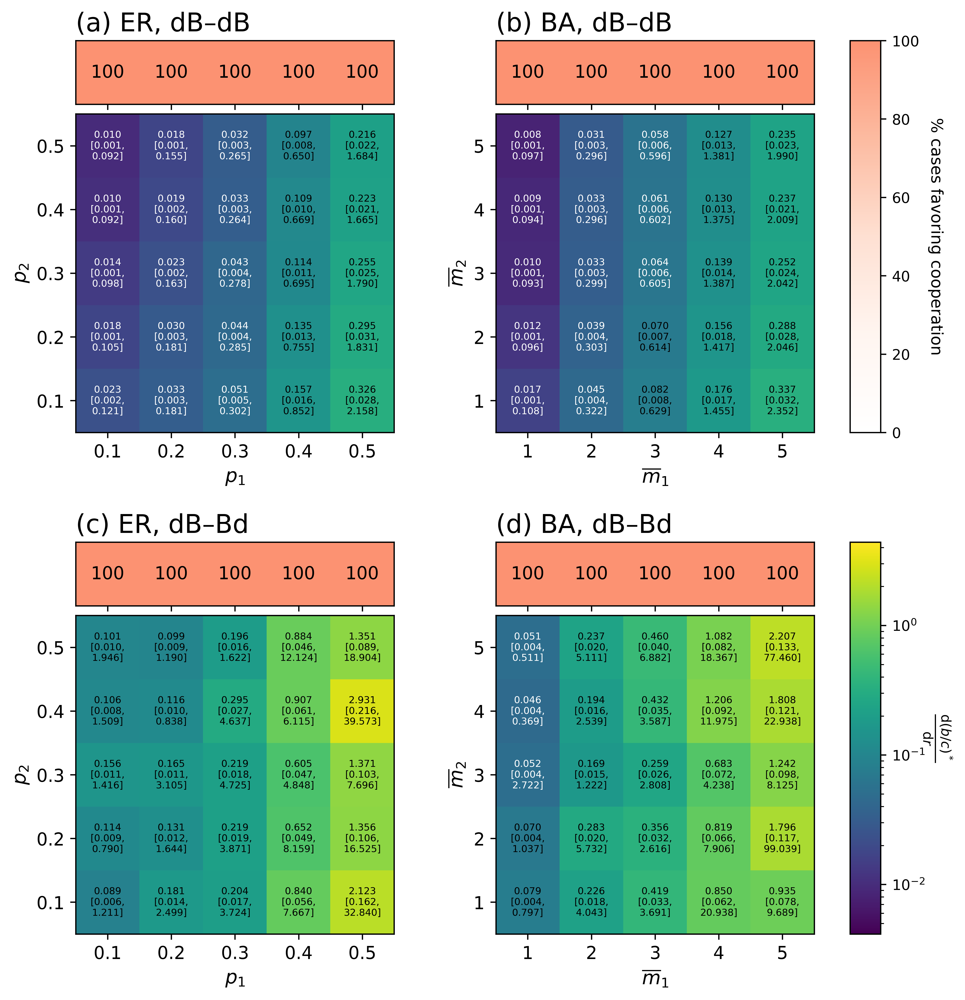

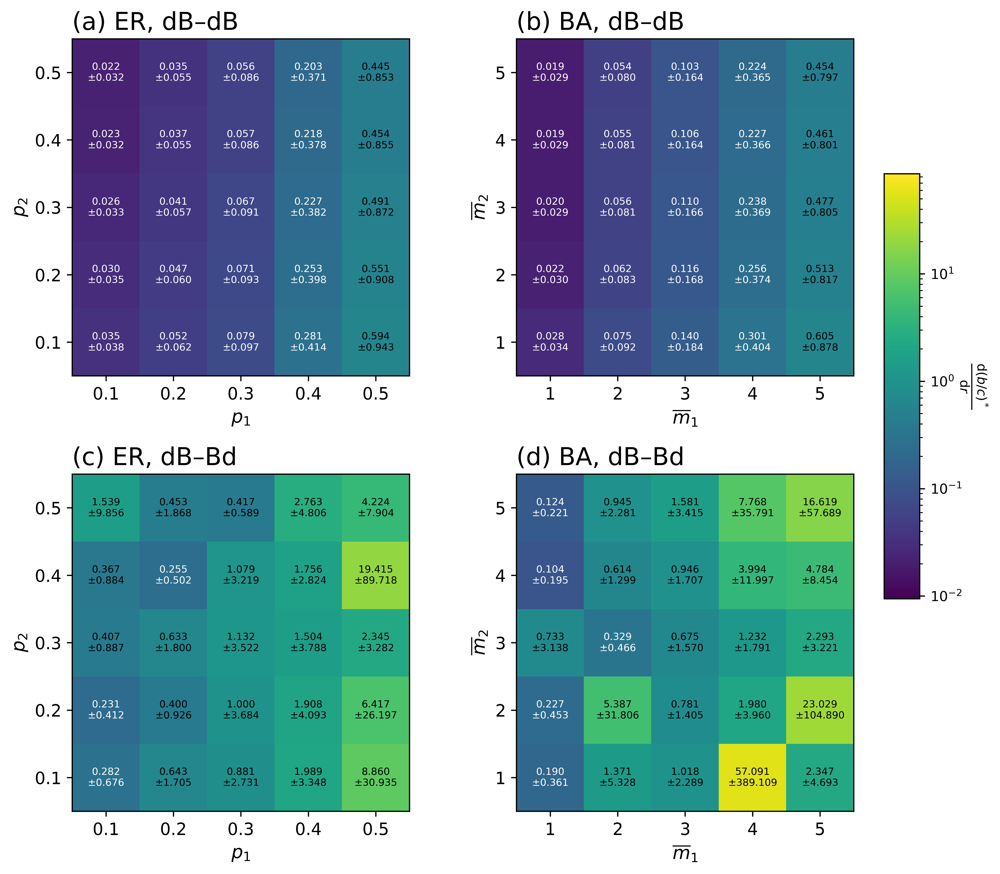

In [126]:
# =============================================================================
if __name__ == "__main__":
    plot_combined_4panel(
        er_db_db_csv="er_db_db_ff.csv",
        er_db_bd_csv="er_db_bd_ff.csv",
        ba_db_db_csv="ba_dB_dB_ff.csv",
        ba_db_bd_csv="ba_dB_Bd_ff.csv",
        dpi=600,
        figsize=(10, 9),
        save_path="random_graphs_2x4_5_95_ff.png",
        cell_fontsize_pct=11,
        cell_fontsize_stat=6,
        decimals=3,
        panel_wspace=-0.3,   # Adjust this to control space between columns (a,c) and (b,d)
        cbar_gap=-0.2        # Adjust this to control colorbar distance from panels
    )
    
    plot_si_mean_std(
        er_db_db_csv="er_db_db_ff.csv",
        er_db_bd_csv="er_db_bd_ff.csv",
        ba_db_db_csv="ba_dB_dB_ff.csv",
        ba_db_bd_csv="ba_dB_Bd_ff.csv",
        dpi=600,
        figsize=(10, 9),
        save_path="random_graphs_mean_std_ff.png",
        cell_fontsize_stat=6.5,    # Same as main figure
        decimals=3,
        panel_wspace=-0,       # Same as main figure
        panel_hspace=0.05,
        cbar_gap=-0.05            # Same as main figure
    )